<img src="https://github.com/nicholasmetherall/digital-earth-pacific-macblue-activities/blob/main/attachments/images/DE_Pacific_banner.JPG?raw=true" width="900"/>
Figure 1.1.a. Jupyter environment + Python notebooks

### Digital Earth Pacific Notebook 1 Train Random Forest Machine Learning (ML) Model

<font color='green'>The objective of this notebook is to train a machine learning model that will allow us to classify an area with the land cover classes defined through the training data. </font>

<font color='blue'>Setup libaries</font>

In [2]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt

<font color='blue'>Define catalogue</font>

In [3]:
catalog = "https://stac.staging.digitalearthpacific.org"
client = Client.open(catalog)

In [4]:
client = Client.open(catalog)

<font color='red'>Define your area of interest - copy and paste the bottom left latitude (min_lat) and the bottem left longitude (min_lon) and the top right latitude (max_lat) and the top right longitude (max_lon)

<font color='red'>In this activity you can use the following examples: 
`-18.1313, -18.1553, 177.4347, 177.4032`
  
<font color='red'>  Note we have reordered these into the wrong order so you will have to define them correctly below:</font>

In [5]:
min_lat = -18.20459
min_lon = 178.33041
max_lat = -18.10000 
max_lon = 178.53506
bbox = [min_lon, min_lat, max_lon, max_lat]

<font color='red'>Define your time of interest - choose a range of a few months in 2024 using the syntax `datetime="YYYY-MM/YYYY-MM"`</font>

In [6]:
datetime="2023"

items = list(client.search(collections=["dep_s2_geomad"], datetime=datetime, bbox=bbox).items())

print(f"Found {len(items)} items")

Found 1 items


<font color='red'>Connect to parallel computers for greater computational capacity - note you should only run this line of code once per notebook activity - do not rerun this line</font>

In [6]:
dask_client = DaskClient(n_workers=1, threads_per_worker=16, memory_limit='16GB')

configure_s3_access(cloud_defaults=True, requester_pays=True)

/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44263 instead
  warnings.warn(


<font color='green'>Search through the catalogue - define the cloud cover threshold you want. Try changing 80 to 50 here: `{"lt": 50}},` </font>

<font color='blue'>Load your satellite dataset based on your search parameters defined above</font>

In [7]:
items

[<Item id=dep_s2_geomad_064_020_2023>]

In [8]:
data = load(
        items,
        measurements=[
            "B02", "B03", "B04", "B05", "B06", "B07", 
            "B08", "B11", "B12", "B8A", 
            "emad", "smad", "bcmad"
        ],
        bbox=bbox,
        chunks={"x": 2048, "y": 2048},
        groupby="solar_day",
    )

<font color='blue'>Set scale and masks and consider the dataset information below including the bands used for analysis:</font>

In [28]:
# Apply scaling and clip values from 0 to / do we need to scale for the GeoMAD 
scaled = (data.where(data != 0) * 0.0001).clip(0, 1)
scaled

scaled = scaled.assign_coords(band=["B02", "B03", "B04", "B05", "B06", "B07", "B08", "B11", "B12", "B8A", "emad", "smad", "bcmad"])
scaled

<xarray.Dataset> Size: 144MB
Dimensions:      (time: 1, y: 1219, x: 2279, band: 13)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
  * time         (time) datetime64[ns] 8B 2023-01-01
  * band         (band) <U5 260B 'B02' 'B03' 'B04' ... 'emad' 'smad' 'bcmad'
Data variables: (12/13)
    B02          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B03          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B04          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B05          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B06          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B07          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    ...           ...
    B11          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B12          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    B8A          (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    emad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    smad         (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>
    bcmad        (time, y, x) float32 11MB dask.array<chunksize=(1, 1219, 2048), meta=np.ndarray>

<font color='blue'>Explore the satellite image dataset you have loaded</font>

In [20]:
scaled.odc.explore(bands=("B04", "B03", "B02"), vmin=0, vmax=0.3)


Generate an image

<font color='red'>The formula for the Modified Normalized Difference Water Index (MDNWI) is: 

- <font color='red'>\(MNDWI=(Green-SWIR)/(Green+SWIR)\)

<font color='red'>Define a variable to store both MNDWI and NDTI using the median xarray dataset

In [21]:
# should we use B11 or B12 for SWIR
mndwi = (scaled["B03"]-scaled["B12"])/(scaled["B03"]+scaled["B12"])


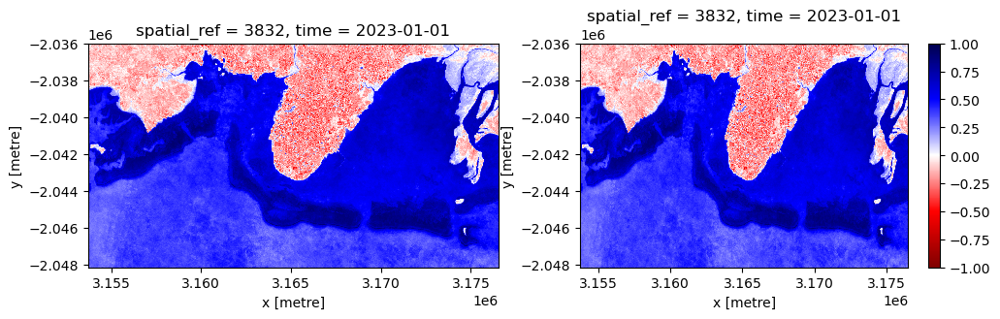

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_mndwi='seismic_r'

vmin=-1
vmax=1

mndwi.plot(ax=ax[0], cmap=cmap_mndwi, add_colorbar=False, vmin=vmin, vmax=vmax)
mndwi.plot(ax=ax[1], cmap=cmap_mndwi, add_colorbar=True, vmin=vmin, vmax=vmax);

In [23]:
mndwi.odc.explore(cmap='seismic_r', vmin=-1, vmax=1)


In [65]:
mndwi = mndwi.squeeze() 

mndwi # Removes dimensions of size 1 (if applicable)

<xarray.DataArray (y: 1219, x: 2279)> Size: 11MB
dask.array<getitem, shape=(1219, 2279), dtype=float32, chunksize=(1219, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2023-01-01

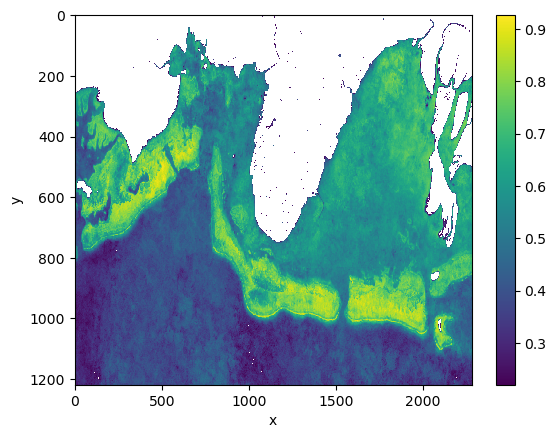

In [74]:
land_mask = mndwi > 0.22
masked_raster = np.ma.masked_where(~land_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da = masked_raster_da.rename({"dim_0": "y", "dim_1": "x"})
masked_raster_da
masked_raster_da.plot.imshow(origin="upper")

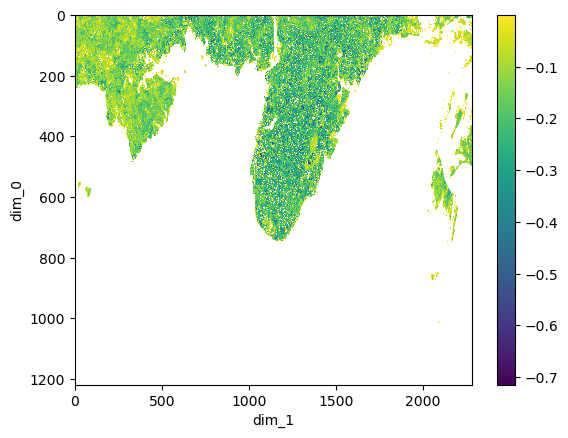

In [80]:
ocean_mask = mndwi < 0
masked_raster = np.ma.masked_where(~ocean_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da.plot.imshow(origin="upper")

In [96]:
masked_raster_da

<xarray.DataArray (dim_0: 1219, dim_1: 2279)> Size: 11MB
array([[-0.17718942, -0.19791664, -0.19379844, ..., -0.10488506,
        -0.11159106, -0.07576793],
       [-0.15628415, -0.17581184, -0.11368421, ..., -0.14242655,
        -0.12865496, -0.10719322],
       [-0.09445585, -0.13395642, -0.08091908, ..., -0.15774025,
        -0.11820656, -0.10490564],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]], dtype=float32)
Dimensions without coordinates: dim_0, dim_1

In [100]:
# Clip da1 using the mask from da2
clipped_da = scaled.where(land_mask)
clipped_da = clipped_da.squeeze()
# clipped_da = clipped_da.rename({"dim_0": "y", "dim_1": "x"})

clipped_da


<xarray.Dataset> Size: 144MB
Dimensions:      (y: 1219, x: 2279, band: 13)
Coordinates:
  * y            (y) float64 10kB -2.036e+06 -2.036e+06 ... -2.048e+06
  * x            (x) float64 18kB 3.154e+06 3.154e+06 ... 3.176e+06 3.177e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2023-01-01
  * band         (band) <U5 260B 'B02' 'B03' 'B04' ... 'emad' 'smad' 'bcmad'
Data variables: (12/13)
    B02          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B03          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B04          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B05          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B06          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B07          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    ...           ...
    B11          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B12          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    B8A          (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    emad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    smad         (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>
    bcmad        (y, x) float32 11MB dask.array<chunksize=(1219, 2048), meta=np.ndarray>

In [104]:
clipped_da.odc.explore(bands=("B04", "B03", "B02"), vmin=0, vmax=0.3)


<font color='red'>The formula for the Normalized Difference Turbidity Index (NDTI) index is: 

- <font color='red'>\(NDTI = (Red - Green) / (Red + Green)\)

In [105]:
ndti = (clipped_da["B04"]-clipped_da["B03"])/(clipped_da["B04"]+clipped_da["B03"])


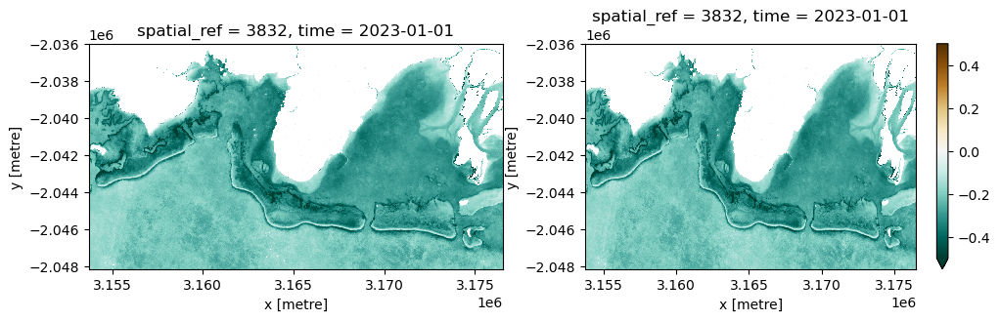

In [106]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_ndti='BrBG_r'

vmin=-0.5
vmax=0.5

ndti.plot(ax=ax[0], cmap=cmap_ndti, add_colorbar=False, vmin=vmin, vmax=vmax)
ndti.plot(ax=ax[1], cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax);

In [109]:
ndti.odc.explore(cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax)


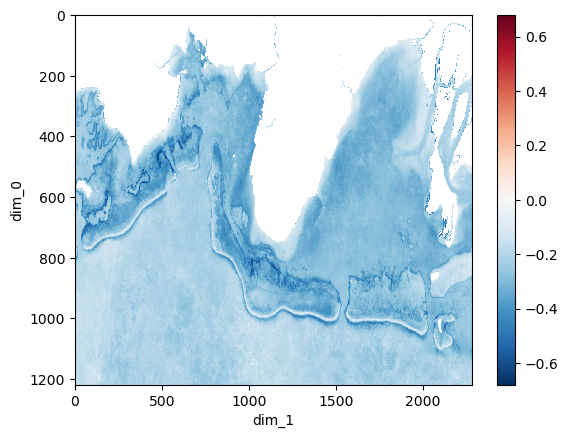

In [107]:
ndti_mask = ndti < 0.2
ndti_masked_raster = np.ma.masked_where(~ndti_mask, ndti)
ndti_masked_raster_da = xr.DataArray(ndti_masked_raster)
ndti_masked_raster_da.plot.imshow(origin="upper")

### Congratulations you have completed this activity. Let the instructors know if you have any questions. Otherwise, move onto the next activity 

<font color='green'>The objective of this notebook was to train the machine learning model that will allow us to classify an area with land cover classes defined through the training data. </font>

<font color='blue'>Finished</font>

In [ ]:
print("Finished, well done")